In [1]:
import numpy as np
import os
import shutil
import time
import cv2
import dicom_global_params
import dicom_cat_params
from dicom_image_functions import read_images, show_images, save_images, merge_images
import dicom_bit_functions as bf

# **Read plain images**

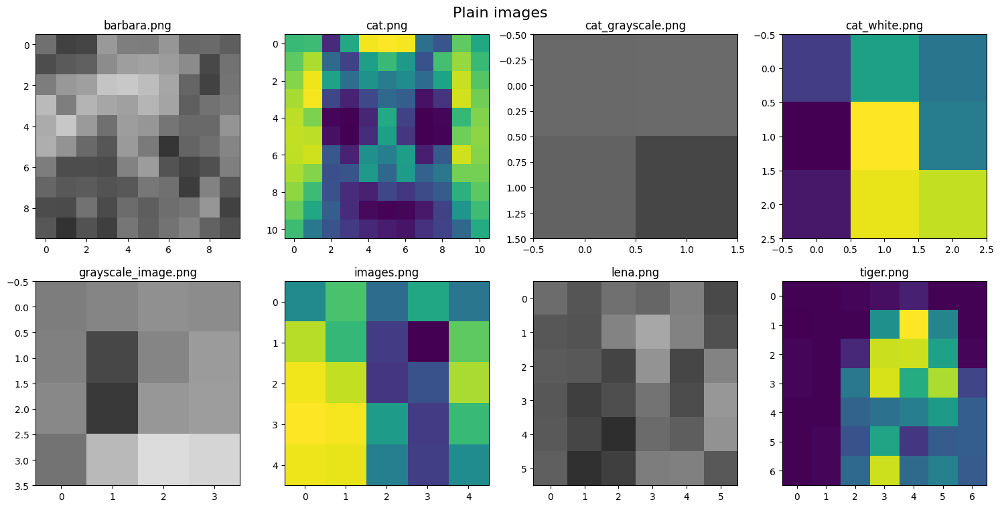

1. Images' sizes:  [[10, 10], [11, 11], [2, 2], [3, 3], [4, 4], [5, 5], [6, 6], [7, 7]]
2. Number of bits:  [16, 8, 16, 8, 16, 8, 16, 8]
3. real_M_max:  11
4. real_N_max:  11


In [2]:
list_os = ['Windows', 'Linux']
OS = list_os[0]
path = 'C:\\Users\\Admin\\Documents\\DICOM\\DICOM_MIE_Cryptography\\' if OS == 'Windows' else '/home/anhpq0/DICOM_MIE_Cryptography/'
dir_plain = path + 'plain_images'

# User IDs and Image IDs
# ID: List of User IDs and Image IDs ([[user_id_1, image_id_0], [user_id_1, image_id_1], [user_id_1, image_id_2], ...])
ID = []
id_user = 0
id_image = 0

# List of images' sizes
list_im_size = []

# List of number of bits
list_num_bits_pre = []

R_iterations = 5
im_base_size = 8

# Read images
I_plains = os.listdir(dir_plain)
N_files = len(I_plains)
kI = []
str_Fnames = []

for i in range(0, N_files):
    size = ((im_base_size + i) % 10 + 2,
            (im_base_size + i) % 10 + 2)
    list_im_size.append([size[0], size[1]])

    name = I_plains[i]
    str_Fnames.append(name)
    if (size[0] % 2):
        Ip = cv2.imread(dir_plain + '\\' + name if OS == 'Windows' else dir_plain + '/' + name, 0)
        Ip_resized = cv2.resize(Ip, size, interpolation = cv2.INTER_AREA)
        Ip_resized = np.uint8(Ip_resized)
        list_num_bits_pre.append(8)
        kI.append(Ip_resized)
        ID.append([id_user, id_image])
    else:
        Ip = cv2.imread(dir_plain + '\\' + name if OS == 'Windows' else dir_plain + '/' + name)
        Ip_resized = cv2.resize(Ip, size, interpolation = cv2.INTER_AREA)
        Ip_resized = np.uint16(Ip_resized)
        list_num_bits_pre.append(16)
        (B, G, R) = cv2.split(Ip_resized)
        kI.append(B)
        kI.append(G)
        kI.append(R)
        ID.append([id_user, id_image])
        ID.append([id_user, id_image])
        ID.append([id_user, id_image])
    id_user += 1
    id_image += 1

# Show images
kI_merge = merge_images(kI = kI, ID = ID)
show_images(kI = kI_merge, suptitle = 'Plain images', str_Fnames = str_Fnames, size = (15, 15), rows = 4, cols = 4)

# Destination folder
dir_cipher = path + 'cipher_images' + dicom_global_params.NamePCM

if (os.path.exists(dir_cipher)):
    shutil.rmtree(dir_cipher)
os.mkdir(dir_cipher)

# Decrypted images folder
dir_decrypted = path + 'decrypted' + dicom_global_params.NamePCM

if (os.path.exists(dir_decrypted)):
    shutil.rmtree(dir_decrypted)
os.mkdir(dir_decrypted)

# Images' sizes
print("1. Images' sizes: ", list_im_size)
real_M_max = 0
real_N_max = 0

for i in range(0, N_files):
    if (list_im_size[i][0] > real_M_max):
        real_M_max = list_im_size[i][0]
    if (list_im_size[i][1] > real_N_max):
        real_N_max = list_im_size[i][1]

# Number of bits
print("2. Number of bits: ", list_num_bits_pre)

print("3. real_M_max: ", real_M_max)
print("4. real_N_max: ", real_N_max)

# **Parameters**

In [3]:
# kC
kC = kI.copy()

#kC-
# kC_minus = np.copy(dicom_global_params.kC0)
kC_minus = [dicom_global_params.kC0[0]]
k = 0
last_id_image = ID[0][1]
for i in range(1, len(ID)):
    new_id_image = ID[i][1]
    if (new_id_image != last_id_image):
        k += 1
    kC_minus.append([dicom_global_params.kC0[k][0]])
    last_id_image = new_id_image
kC_minus = np.asarray(kC_minus)

#kP+
# kP_plus = np.copy(dicom_global_params.kP0)
kP_plus = []

for i in range(len(ID)):
    kP_plus.append([kC[i][0][1]])
kP_plus = np.asarray(kP_plus)

print("1. kC_minus: ", kC_minus)
print("\n2. kP_plus: ", kP_plus)

1. kC_minus:  [[123]
 [123]
 [123]
 [ 11]
 [ 27]
 [ 27]
 [ 27]
 [ 88]
 [ 33]
 [ 33]
 [ 33]
 [211]
 [ 97]
 [ 97]
 [ 97]
 [ 63]]

2. kP_plus:  [[ 65]
 [ 65]
 [ 65]
 [153]
 [106]
 [106]
 [106]
 [ 90]
 [133]
 [133]
 [133]
 [185]
 [ 85]
 [ 85]
 [ 85]
 [  6]]


In [4]:
# Rules of bit arrangement (list of numpy arrays)
Yp_MN = dicom_cat_params.Yp_16x16_Cat

# RV
RV = [[[0] * list_im_size[i][1] for j in range(list_im_size[i][0])] for i in range(len(list_im_size))]

# RV_ENC
RV_ENC = []

# RV_DEC
RV_DEC = []

print("1.RV: ", RV)
print("\n2.RV_ENC: ", RV_ENC)
print("\n3.RV_DEC: ", RV_DEC)

1.RV:  [[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 0], [0, 0]], [[0, 0, 0], [0, 0, 0], [0, 0, 0]], [[0, 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0]], [[0, 0, 0, 0, 0], [0, 0, 0, 0, 0], [0, 0, 0, 0, 0], [0, 0, 0, 0, 0], [0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 

# **Encryption**

In [5]:
print("---------------------------------------------------------")
print("\t\tEncryption Initial Parameters")
print("---------------------------------------------------------")

print("1. kC: \n", kC)
print("\n2. kC_minus: \n", kC_minus)
print("\n3. kP_plus: \n", kP_plus)
print("\n4. RV_ENC: \n", RV_ENC)
print("\n\n")

print("=============================START ENCRYPTION PROCESSING=============================")
for n in range(dicom_global_params.Ne):
    start_time = time.time() # Record start time in seconds unit
    print("\n")
    print("\t---------------------------------------------------------")
    print("\t-------------------|      STEP ",n,"   |-------------------")
    print("\t---------------------------------------------------------\n")
    for i in range(real_M_max):
        for j in range(real_N_max):
            print("\n------------------------")
            print("|    Pixel ["+ str(i)+ "], [" + str(j) + "]    |")
            print("------------------------")

            # Linear Constraint Function for Encryption process
            LCF, RV = bf.linear_constraint_function_enc(ID               = ID                 , 
                                                        I0               = dicom_cat_params.I0, 
                                                        RV               = RV                 , 
                                                        XY               = [i, j]             , 
                                                        kP_plus          = kP_plus            , 
                                                        kC_minus         = kC_minus           , 
                                                        list_im_size     = list_im_size        )
            print("\n1. LCF: \n", LCF, "\n")
            print("\n2. RV: \n", RV, "\n")
            # if (i < 10 and j < 10):
            #     print("\n2. RV[0][i][j]: \n", RV[0][i][j], "\n")

            # Bit Manipulation before Cat PCM
            E = bf.bit_manipulation(s1          = LCF                    , 
                                    s2          = ""                     , 
                                    output_size = dicom_cat_params.k1_cat )
            print("\n3. E: \n", E, "\n")

            # PCM Cat
            X_R = bf.pcm_cat(E           = E                           , 
                             Y1_FAST_Cat = dicom_cat_params.Y1_FAST_Cat, 
                             Y2_FAST_Cat = dicom_cat_params.Y2_FAST_Cat, 
                             Y3_FAST_Cat = dicom_cat_params.Y3_FAST_Cat, 
                             Y4_FAST_Cat = dicom_cat_params.Y4_FAST_Cat, 
                             R           = R_iterations                 )
            print("4. X_R: \n", X_R, "\n")

            # XY, phi generation
            XY_new, phi_source, phi_dest = bf.xy_phi_generation(X_R              = X_R                               , 
                                                                Yp_MN            = Yp_MN                             , 
                                                                Y_phi_source     = dicom_cat_params.Yd_phi_source_Cat, 
                                                                Y_phi_dest       = dicom_cat_params.Yd_phi_dest_Cat   )
            print("5. XY_new: \n", XY_new, "\n")
            print("6. phi_source: \n", phi_source, "\n")
            print("7. phi_dest: \n", phi_dest, "\n")

            # Bit Pre-processing for all images
            XY_P, phi_source_P, phi_dest_P = bf.bit_pre_processing(XY                = [i, j]           , 
                                                                   XY_new            = XY_new           , 
                                                                   phi_source        = phi_source       , 
                                                                   phi_dest          = phi_dest         , 
                                                                   list_im_size      = list_im_size     , 
                                                                   list_num_bits_pre = list_num_bits_pre )
            print("8. XY_P: \n", XY_P, "\n")
            print("9. phi_source_P: \n", phi_source_P, "\n")
            print("10. phi_dest_P: \n", phi_dest_P, "\n")

            # Permutation and Diffusion for Encryption process
            kC_minus, kP_plus, kC = bf.dicom_mie_perm_diff_enc(ID                = ID               , 
                                                               kI                = kC               , 
                                                               XY                = [i, j]           , 
                                                               XY_P              = XY_P             , 
                                                               phi_source_P      = phi_source_P     , 
                                                               phi_dest_P        = phi_dest_P       , 
                                                               prev_kP_plus      = kP_plus          , 
                                                               kC_minus          = kC_minus         , 
                                                               list_im_size      = list_im_size     , 
                                                               n                 = n                 )
            print("\n11. kC_minus: \n", kC_minus)
            print("\n12. kP_plus: \n", kP_plus)
            print("\n13. kC: \n", kC)

    RV_ENC.append(RV)
    RV = [[[0] * list_im_size[b][1] for a in range(list_im_size[b][0])] for b in range(len(list_im_size))]
    end_time = time.time() # Record end time in senconds unit
    print("Simulation time of step ", n, ": ", end_time - start_time)

print("\nAfter encryption process: RV_ENC = ", RV_ENC)

kC_merge = merge_images(kI = kC, 
                        ID = ID )

save_images(kC          = kC_merge  , 
            folder_path = dir_cipher, 
            str_Fnames  = str_Fnames )

---------------------------------------------------------
		Encryption Initial Parameters
---------------------------------------------------------
1. kC: 
 [array([[112,  65,  69, 153, 126, 125, 150, 103, 106,  94],
       [ 77,  90,  96, 140, 158, 162, 156, 139,  72, 114],
       [125, 152, 159, 196, 200, 189, 166, 101,  66, 116],
       [186, 126, 180, 166, 160, 181, 164,  95, 114, 122],
       [171, 199, 154, 112, 157, 150, 117, 105, 105, 148],
       [174, 147, 105,  86, 154, 122,  53, 100, 111, 133],
       [125,  77,  77,  75, 130, 156,  83,  68,  80, 127],
       [102,  88,  91,  83,  88, 119, 112,  60, 130,  87],
       [ 76,  75, 114,  75, 108,  94, 110, 117, 150,  65],
       [ 87,  50,  82,  63, 118,  96, 115, 130,  98,  80]], dtype=uint16), array([[112,  65,  69, 153, 126, 125, 150, 103, 106,  94],
       [ 77,  90,  96, 140, 158, 162, 156, 139,  72, 114],
       [125, 152, 159, 196, 200, 189, 166, 101,  66, 116],
       [186, 126, 180, 166, 160, 181, 164,  95, 114, 122],


# **Read cipher image**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1. Images' sizes:  [[10, 10], [11, 11], [2, 2], [3, 3], [4, 4], [5, 5], [6, 6], [7, 7]]
2. Number of bits:  [16, 8, 16, 8, 16, 8, 16, 8]
3. real_M_max:  11
4. real_N_max:  11


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


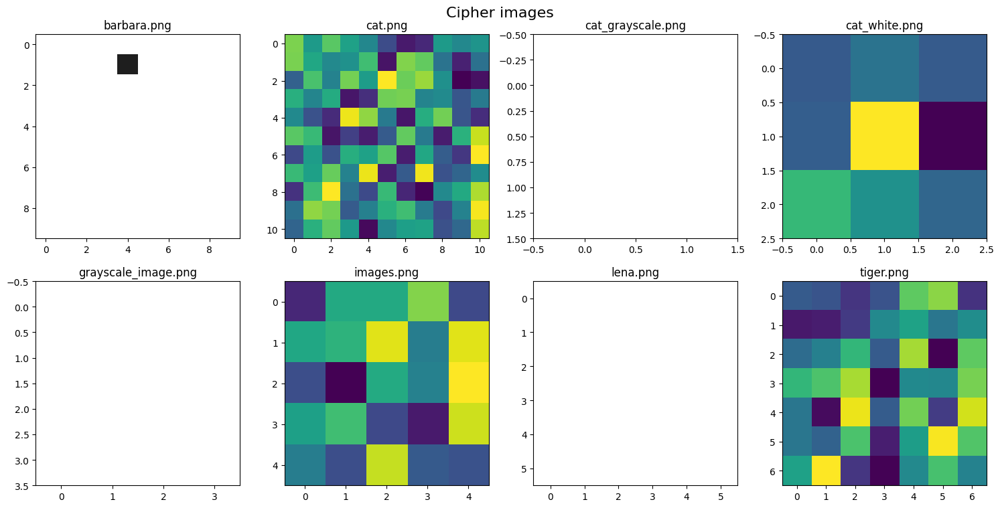

5. kC_cipher_minus:  [[39013]
 [39013]
 [39013]
 [   85]
 [36015]
 [36015]
 [36015]
 [  131]
 [31681]
 [31681]
 [31681]
 [   90]
 [14807]
 [14807]
 [14807]
 [  175]]
6. kP_cipher_plus:  [[ 64]
 [ 64]
 [ 64]
 [154]
 [ 37]
 [ 37]
 [ 37]
 [ 73]
 [ 17]
 [ 17]
 [ 17]
 [ 56]
 [ 72]
 [ 72]
 [ 72]
 [ 68]]


In [6]:
# Read images
I_ciphers = os.listdir(dir_cipher)
N_files = len(I_ciphers)
kI_cipher = []
str_Fnames_cipher = str_Fnames.copy()

# Images' sizes
print("1. Images' sizes: ", list_im_size)
real_M_max = 0
real_N_max = 0

for i in range(0, N_files):
    if (list_im_size[i][0] > real_M_max):
        real_M_max = list_im_size[i][0]
    if (list_im_size[i][1] > real_N_max):
        real_N_max = list_im_size[i][1]

# Number of bits
print("2. Number of bits: ", list_num_bits_pre)

print("3. real_M_max: ", real_M_max)
print("4. real_N_max: ", real_N_max)

for i in range(0, N_files):
    name = I_ciphers[i]
    if (list_im_size[i][0] % 2):
        Ip = cv2.imread(dir_cipher + '\\' + name if OS == 'Windows' else dir_cipher + '/' + name, cv2.IMREAD_ANYDEPTH)
        # Ip_gray = cv2.cvtColor(Ip, cv2.COLOR_BGR2GRAY)
        Ip_resized = cv2.resize(Ip, (list_im_size[i][1], list_im_size[i][0]), interpolation = cv2.INTER_AREA)
        Ip_resized = np.uint8(Ip_resized)
        # Ip_resized = np.pad(Ip_resized, pad_width=((0, real_M_max - list_im_size[i][0]), 
        #                                            (0, real_N_max - list_im_size[i][1])), mode='constant')
        kI_cipher.append(Ip_resized)
    else:
        Ip = cv2.imread(dir_cipher + '\\' + name if OS == 'Windows' else dir_cipher + '/' + name, cv2.IMREAD_UNCHANGED)
        Ip_bgr = cv2.cvtColor(Ip, cv2.COLOR_BGRA2BGR)
        Ip_resized = cv2.resize(Ip_bgr, (list_im_size[i][1], list_im_size[i][0]), interpolation = cv2.INTER_AREA)
        Ip_resized = np.uint16(Ip_resized)
        (B, G, R) = cv2.split(Ip_resized)
        kI_cipher.append(B)
        kI_cipher.append(G)
        kI_cipher.append(R)
    id_user += 1
    id_image += 1

# Show images
kI_cipher_merge = merge_images(kI = kI_cipher, ID = ID)
show_images(kI = kI_cipher_merge, suptitle = 'Cipher images', str_Fnames = str_Fnames_cipher, size = (15, 15), rows = 4, cols = 4)

# kC_cipher
kC_cipher = kI_cipher.copy()

#kC_cipher-
kC_cipher_minus = []

k = 0
last_id_image = ID[0][1]
for i in range(len(ID)):
    new_id_image = ID[i][1]
    if (new_id_image != last_id_image):
        k += 1
    kC_cipher_minus.append([kC_cipher[i][list_im_size[k][0]-1][list_im_size[k][1]-2]])
    last_id_image = new_id_image
kC_cipher_minus = np.asarray(kC_cipher_minus)

#kP_cipher+
kP_cipher_plus = []

k = 0
last_id_image = ID[0][1]
for i in range(len(ID)):
    new_id_image = ID[i][1]
    if (new_id_image != last_id_image):
        k += 1
    kP_cipher_plus.append([dicom_global_params.kP0[k][0]])
    last_id_image = new_id_image
kP_cipher_plus = np.asarray(kP_cipher_plus)

print("5. kC_cipher_minus: ", kC_cipher_minus)
print("6. kP_cipher_plus: ", kP_cipher_plus)

# **Decryption for Single Image**

---------------------------------------------------------
		Decryption Initial Parameters
---------------------------------------------------------
1. kC_cipher[1]: 
 [array([[203, 138, 188, 145, 117,  59,  18,  29, 138, 118, 131],
       [202, 151, 119, 128, 175,  13, 205, 192,  96,  23,  94],
       [ 79, 180, 112, 200, 140, 253, 196, 215, 127,   0,  11],
       [160, 115, 156,  15,  34, 198, 201, 114, 121,  68, 103],
       [120,  64,  31, 247, 211, 104,  15, 158, 199,  67,  33],
       [188, 170,  14,  48,  20,  73, 192, 104,  19, 162, 232],
       [ 56, 140,  64, 159, 145, 186,  20, 152,  75,  41, 253],
       [171, 144, 194, 112, 246,  21,  73, 248,  64,  83, 123],
       [ 37, 173, 253,  94,  57, 170,  27,   2, 119, 154, 222],
       [ 93, 211, 200,  73, 110, 161, 175, 105,  56, 112, 250],
       [ 82, 161, 192, 137,   6, 118, 143, 146,  63,  85, 228]],
      dtype=uint8)]

2. kC_cipher_minus: 
 [[85]]

3. kP_cipher_plus: 
 [[154]]



=============================START DECRYPTIO

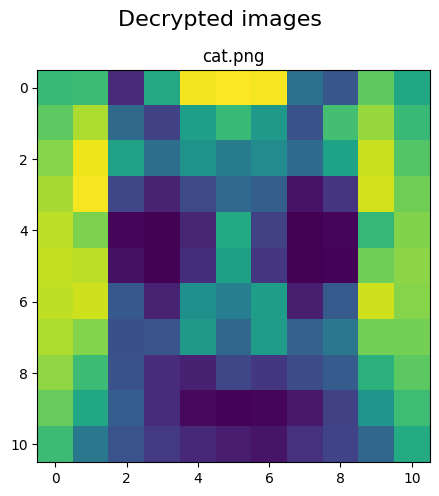

In [7]:
print("---------------------------------------------------------")
print("\t\tDecryption Initial Parameters")
print("---------------------------------------------------------")

# Order of image user want to decrypt
k = 1

# kC_cipher_minus
kC_cipher_minus_k = []

# kP_cipher_plus
kP_cipher_plus_k = []

# kC_cipher_k
kC_cipher_k = []

image_k = 0
last_id_image = ID[0][1]
for i in range(len(ID)):
    new_id_image = ID[i][1]
    if (new_id_image != last_id_image):
        image_k += 1
    if (image_k == k):
        kC_cipher_minus_k.append([kC_cipher[i][list_im_size[k][0] - 1][list_im_size[k][1] - 2]])
        kP_cipher_plus_k.append([dicom_global_params.kP0[k][0]])
        kC_cipher_k.append(kC_cipher[i].copy())
    elif (image_k > k):
        break
    last_id_image = new_id_image

print("1. kC_cipher[" + str(k) + "]: \n", kC_cipher_k)
print("\n2. kC_cipher_minus: \n", kC_cipher_minus_k)
print("\n3. kP_cipher_plus: \n", kP_cipher_plus_k)
RV_DEC = RV_ENC.copy()
# RV_DEC_k = []
# for n in range(dicom_global_params.Ne):
#     RV_DEC_k.append(RV_DEC[n][k])
# print("\n4. RV_DEC[" + str(k) + "]: \n", RV_DEC_k)
print("\n\n")

print("=============================START DECRYPTION PROCESSING=============================")
for n in range(dicom_global_params.Ne - 1, -1, -1):
    start_time = time.time() # Record start time in seconds unit
    print("\n")
    print("\t---------------------------------------------------------")
    print("\t-------------------|      STEP ",n,"   |-------------------")
    print("\t---------------------------------------------------------\n")
    for i in range(list_im_size[k][0] - 1, -1, -1):
        for j in range(list_im_size[k][1] - 1, -1, -1):
            print("------------------------")
            print("|    Pixel ["+ str(i)+ "], [" + str(j) + "]    |")
            print("------------------------")

            # Linear Constraint Function
            LCF = bf.linear_constraint_function_dec_k(I0               = dicom_cat_params.I0 , 
                                                      rv               = RV_DEC[n][k][i][j]  , 
                                                      p_plus           = kP_cipher_plus_k     )
            print("\n1. LCF: \n", LCF, "\n")
            print("2. rv: \n", RV_DEC[n][k][i][j], "\n")

            # Bit Manipulation before Cat PCM
            E = bf.bit_manipulation(s1          = LCF                    , 
                                    s2          = ""                     , 
                                    output_size = dicom_cat_params.k1_cat )
            print("\n3. E: \n", E, "\n")

            # PCM Cat
            X_R = bf.pcm_cat(E           = E                           , 
                             Y1_FAST_Cat = dicom_cat_params.Y1_FAST_Cat, 
                             Y2_FAST_Cat = dicom_cat_params.Y2_FAST_Cat, 
                             Y3_FAST_Cat = dicom_cat_params.Y3_FAST_Cat, 
                             Y4_FAST_Cat = dicom_cat_params.Y4_FAST_Cat, 
                             R           = R_iterations                 )
            print("\n4. X_R: \n", X_R, "\n")

            # XY, phi generation
            XY_new_k, phi_source_k, phi_dest_k = bf.xy_phi_generation_k(k                = k                                 , 
                                                                        X_R              = X_R                               , 
                                                                        Yp_MN            = Yp_MN                             , 
                                                                        Y_phi_source     = dicom_cat_params.Yd_phi_source_Cat, 
                                                                        Y_phi_dest       = dicom_cat_params.Yd_phi_dest_Cat   )
            print("\n5. XY_new_k: \n", XY_new_k, "\n")
            print("6. phi_source_k: \n", phi_source_k, "\n")
            print("7. phi_dest_k: \n", phi_dest_k, "\n")

            # Bit Pre-processing for all images
            XY_Pk, phi_source_Pk, phi_dest_Pk = bf.bit_pre_processing_k(XY_k           = [i, j]              , 
                                                                        XY_new_k       = XY_new_k            , 
                                                                        phi_source_k   = phi_source_k        , 
                                                                        phi_dest_k     = phi_dest_k          , 
                                                                        M_k            = list_im_size[k][0]  , 
                                                                        N_k            = list_im_size[k][1]  , 
                                                                        num_bits_pre_k = list_num_bits_pre[k] )
            print("\n8. XY_Pk: \n", XY_Pk, "\n")
            print("9. phi_source_Pk: \n", phi_source_Pk, "\n")
            print("10. phi_dest_Pk: \n", phi_dest_Pk, "\n")

            # Permutation and Diffusion for Decryption process
            kC_cipher_minus_k, kP_cipher_plus_k, kC_cipher_k = bf.dicom_mie_perm_diff_dec_mc_k(k             = k                   , 
                                                                                               kC            = kC_cipher_k         , 
                                                                                               XY            = [i, j]              , 
                                                                                               XY_Pk         = XY_Pk               , 
                                                                                               phi_source_Pk = phi_source_Pk       , 
                                                                                               phi_dest_Pk   = phi_dest_Pk         , 
                                                                                               kC_minus      = kC_cipher_minus_k   , 
                                                                                               M_k           = list_im_size[k][0]  , 
                                                                                               N_k           = list_im_size[k][1]  , 
                                                                                               n             = n                    )
            print("\n11. kC_cipher_minus_k: \n", kC_cipher_minus_k, "\n")
            print("\n12. kP_cipher_plus_k: \n", kP_cipher_plus_k, "\n")
            print("\n13. kC_cipher_k: \n", kC_cipher_k, "\n")

    end_time = time.time() # Record end time in senconds unit
    print("Simulation time of step ", n, ": ", end_time - start_time)

kC_cipher_k_merge = merge_images(kI = kC_cipher_k             , 
                                 ID = [[0, 0], [0, 0], [0, 0]] )

save_images(kC_cipher_k_merge, dir_decrypted, [str_Fnames_cipher[k]])
show_images(kI = kC_cipher_k_merge, suptitle = 'Decrypted images', str_Fnames = [str_Fnames_cipher[k]], 
            size = (5, 5), rows = 1, cols = 1)

# **Decryption for All Images**

---------------------------------------------------------
		Decryption Initial Parameters
---------------------------------------------------------
1. kC_cipher: 
 [array([[57084,  5332, 22875, 30485, 18837, 43345, 55690, 24730, 31290,
        50336],
       [38489, 56441, 21985, 20624,    30, 62487,  6515, 15831, 41567,
        14470],
       [58205, 36697,  9865, 26866, 51114,  8361, 48045, 45269,  1328,
         7391],
       [42119, 54072, 33814, 50221, 27681, 11516, 47072, 25856, 39336,
        43800],
       [ 7811, 29284,  7412, 10947, 44320, 56698,  5940, 40261, 31798,
        20133],
       [31740, 35065, 30871, 42981, 44499,  5847, 55186, 45625, 54461,
        36607],
       [26997, 60682, 32510, 39918, 15399, 31495,  4166, 22427, 55331,
        27045],
       [ 8053, 55498, 44524,  8874, 27415, 27319, 12208, 31876, 14766,
        46799],
       [22869, 11680, 56504, 47573,  1316, 22825, 52269, 40172, 25497,
        37589],
       [ 5444, 39710, 52767, 55456, 35213, 11233, 36

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


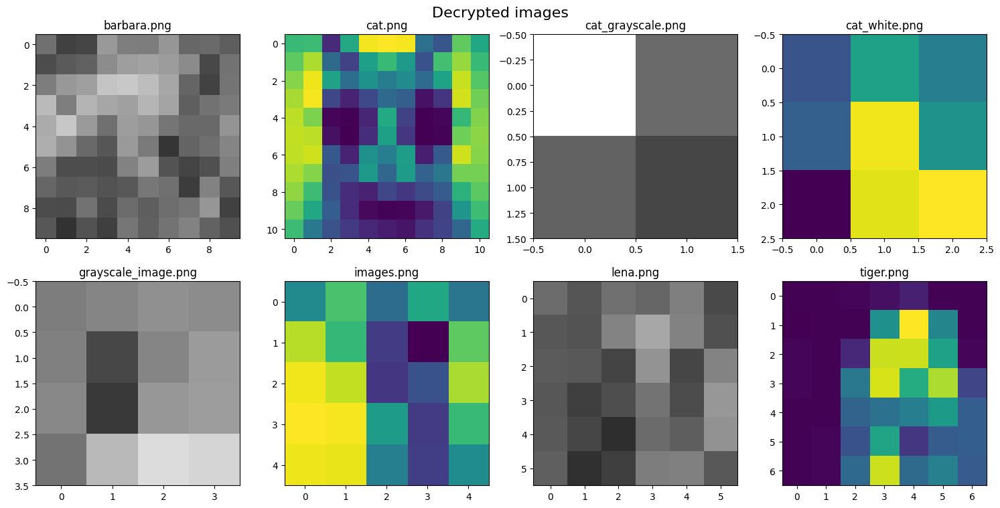

In [8]:
print("---------------------------------------------------------")
print("\t\tDecryption Initial Parameters")
print("---------------------------------------------------------")

print("1. kC_cipher: \n", kC_cipher)
print("\n2. kC_cipher_minus: \n", kC_cipher_minus)
print("\n3. kP_cipher_plus: \n", kP_cipher_plus)
RV_DEC = RV_ENC.copy()
print("\n\n")

print("=============================START DECRYPTION PROCESSING=============================")
for n in range(dicom_global_params.Ne - 1, -1, -1):
    start_time = time.time() # Record start time in seconds unit
    print("\n")
    print("\t---------------------------------------------------------")
    print("\t-------------------|      STEP ",n,"   |-------------------")
    print("\t---------------------------------------------------------\n")
    for i in range(real_M_max - 1, -1, -1):
        for j in range(real_N_max - 1, -1, -1):
            print("------------------------")
            print("|    Pixel ["+ str(i)+ "], [" + str(j) + "]    |")
            print("------------------------")

            # Linear Constraint Function
            LCF = bf.linear_constraint_function_dec(ID           = ID                 , 
                                                    I0           = dicom_cat_params.I0, 
                                                    XY           = [i, j]             , 
                                                    RV           = RV_DEC[n]          , 
                                                    kP_plus      = kP_cipher_plus     , 
                                                    list_im_size = list_im_size        )
            print("\n1. LCF: \n", LCF, "\n")
            print("2. RV: \n", RV_DEC[n], "\n")

            # Bit Manipulation before Cat PCM
            E = bf.bit_manipulation(s1          = LCF                    , 
                                    s2          = ""                     , 
                                    output_size = dicom_cat_params.k1_cat )
            print("\n3. E: \n", E, "\n")

            # PCM Cat
            X_R = bf.pcm_cat(E           = E                           , 
                             Y1_FAST_Cat = dicom_cat_params.Y1_FAST_Cat, 
                             Y2_FAST_Cat = dicom_cat_params.Y2_FAST_Cat, 
                             Y3_FAST_Cat = dicom_cat_params.Y3_FAST_Cat, 
                             Y4_FAST_Cat = dicom_cat_params.Y4_FAST_Cat, 
                             R           = R_iterations                 )
            print("\n4. X_R: \n", X_R, "\n")

            # XY, phi generation
            XY_new, phi_source, phi_dest = bf.xy_phi_generation(X_R              = X_R                               , 
                                                                Yp_MN            = Yp_MN                             , 
                                                                Y_phi_source     = dicom_cat_params.Yd_phi_source_Cat, 
                                                                Y_phi_dest       = dicom_cat_params.Yd_phi_dest_Cat   )
            print("\n5. XY_new_k: \n", XY_new, "\n")
            print("6. phi_source_k: \n", phi_source, "\n")
            print("7. phi_dest_k: \n", phi_dest, "\n")

            # Bit Pre-processing for all images
            XY_P, phi_source_P, phi_dest_P = bf.bit_pre_processing(XY                = [i, j]           , 
                                                                   XY_new            = XY_new           , 
                                                                   phi_source        = phi_source       , 
                                                                   phi_dest          = phi_dest         , 
                                                                   list_im_size      = list_im_size     , 
                                                                   list_num_bits_pre = list_num_bits_pre )
            print("\n8. XY_P: \n", XY_P, "\n")
            print("9. phi_source_P: \n", phi_source_P, "\n")
            print("10. phi_dest_P: \n", phi_dest_P, "\n")

            # Permutation and Diffusion for Decryption process
            kC_cipher_minus, kP_cipher_plus, kC_cipher = bf.dicom_mie_perm_diff_dec(ID           = ID             , 
                                                                                    kC           = kC_cipher      , 
                                                                                    XY           = [i, j]         , 
                                                                                    XY_P         = XY_P           , 
                                                                                    phi_source_P = phi_source_P   , 
                                                                                    phi_dest_P   = phi_dest_P     , 
                                                                                    prev_kP_plus = kP_cipher_plus , 
                                                                                    kC_minus     = kC_cipher_minus, 
                                                                                    list_im_size = list_im_size   , 
                                                                                    n            = n               )
            print("\n11. kC_cipher_minus: \n", kC_cipher_minus, "\n")
            print("\n12. kP_cipher_plus: \n", kP_cipher_plus, "\n")
            print("\n13. kC_cipher: \n", kC_cipher, "\n")

    end_time = time.time() # Record end time in senconds unit
    print("Simulation time of step ", n, ": ", end_time - start_time)

kC_cipher_merge = merge_images(kI = kC_cipher, 
                               ID = ID        )

save_images(kC_cipher_merge, dir_decrypted, str_Fnames_cipher)
show_images(kI = kC_cipher_merge, suptitle = 'Decrypted images', str_Fnames = str_Fnames_cipher, 
            size = (15, 15), rows = 4, cols = 4)